In [1]:
import math
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import style
import matplotlib
import h5py
import time
# import NaiveDE
# import SpatialDE
import scanpy as sc
import sklearn
import networkx as nx
import ot
import scanorama
import paste as pst
from paste.helper import to_dense_array
%load_ext autoreload
%autoreload 2
# style.use('seaborn-dark')
style.use('seaborn-white')

In [2]:
def last_point(list_of_intervals):
    sorted_list_of_intervals = sorted(list_of_intervals)
    candidate = sorted_list_of_intervals[0][1]
    for i in range(1,len(sorted_list_of_intervals)):
        if candidate < sorted_list_of_intervals[i][0]:
            break
        elif candidate < sorted_list_of_intervals[i][1]:
            candidate = sorted_list_of_intervals[i][1]
    return candidate

In [3]:
data_path = '../data/HER2/'
samples_per_patient = {'A':6,'B':6,'C':6,'D':6,'E':3,'F':3,'G':3,'H':3}
patients = {p:[0 for i in range(samples_per_patient[p])] for p in samples_per_patient}
for p in samples_per_patient:
    print('Patient ',p)
    for i in range(samples_per_patient[p]):
        print("\t Slice ",i+1)
        s = sc.read_csv(data_path+'{0}{1}.tsv.gz'.format(p,i+1),delimiter='\t')
        n,g = s.shape
        print(s.shape)
        s.obsm['spatial'] = np.array(list(map(lambda x: x.split('x'),s.obs.index)),dtype=float)
        sc.pp.filter_genes(s, min_counts = 15)
        sc.pp.filter_cells(s, min_counts = 100)
        print(s.shape)
        print(n-s.shape[0],g-s.shape[1])
        patients[p][i] = s

Patient  A
	 Slice  1
(346, 15045)
(345, 9374)
1 5671
	 Slice  2
(325, 15526)
(323, 10854)
2 4672
	 Slice  3
(359, 15517)
(356, 10566)
3 4951
	 Slice  4
(343, 15583)
(341, 10446)
2 5137
	 Slice  5
(332, 15638)
(329, 10195)
3 5443
	 Slice  6
(360, 15645)
(357, 10550)
3 5095
Patient  B
	 Slice  1
(295, 15109)
(293, 8928)
2 6181
	 Slice  2
(270, 15290)
(268, 9526)
2 5764
	 Slice  3
(298, 15215)
(297, 8954)
1 6261
	 Slice  4
(283, 15289)
(281, 9134)
2 6155
	 Slice  5
(289, 15273)
(287, 9225)
2 6048
	 Slice  6
(277, 15387)
(277, 9339)
0 6048
Patient  C
	 Slice  1
(176, 15557)
(174, 10693)
2 4864
	 Slice  2
(187, 15706)
(185, 10829)
2 4877
	 Slice  3
(180, 15821)
(179, 11103)
1 4718
	 Slice  4
(184, 15842)
(184, 11108)
0 4734
	 Slice  5
(181, 15721)
(179, 10951)
2 4770
	 Slice  6
(178, 15772)
(176, 11078)
2 4694
Patient  D
	 Slice  1
(306, 15661)
(306, 11432)
0 4229
	 Slice  2
(303, 15396)
(302, 10321)
1 5075
	 Slice  3
(301, 15529)
(300, 10685)
1 4844
	 Slice  4
(302, 15503)
(299, 10607)
3 

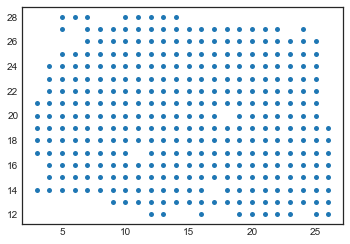

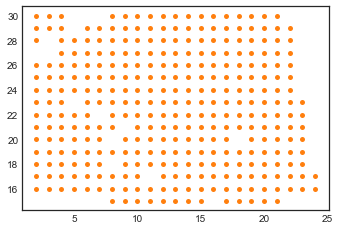

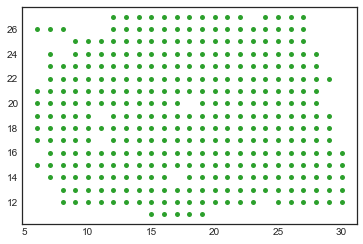

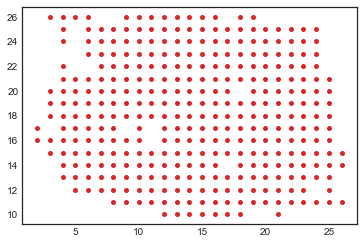

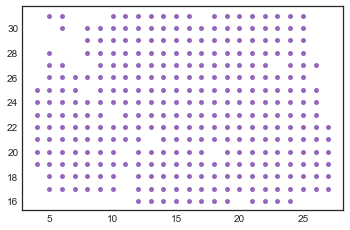

...

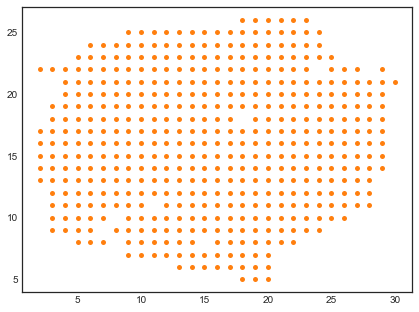

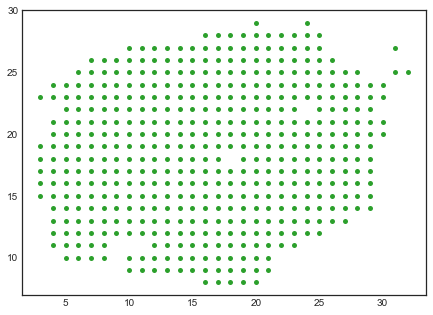

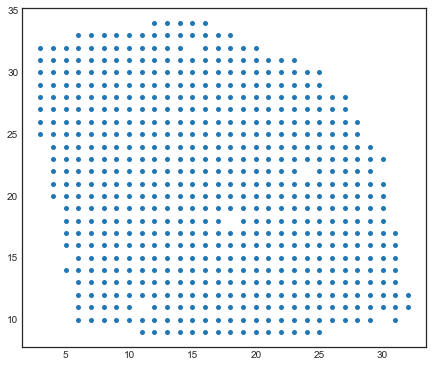

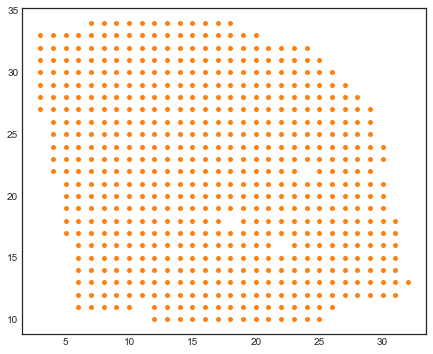

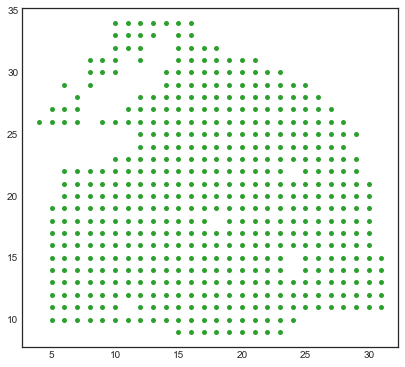

In [4]:
slice_colors = sns.color_palette()
for p in patients:
    for i in range(len(patients[p])):
        l = (patients[p][i].obsm['spatial'].max(axis=0)-patients[p][i].obsm['spatial'].min(axis=0))/4
        fig = plt.figure(figsize=(l[0],l[1]))
        pst.plot_slice(patients[p][i],slice_colors[i])
        plt.show()

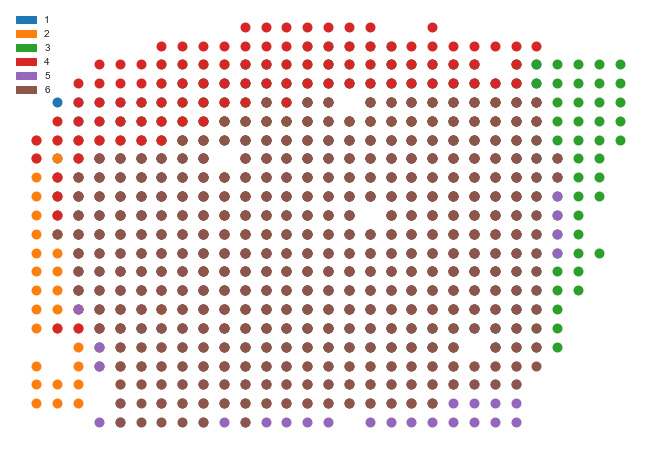

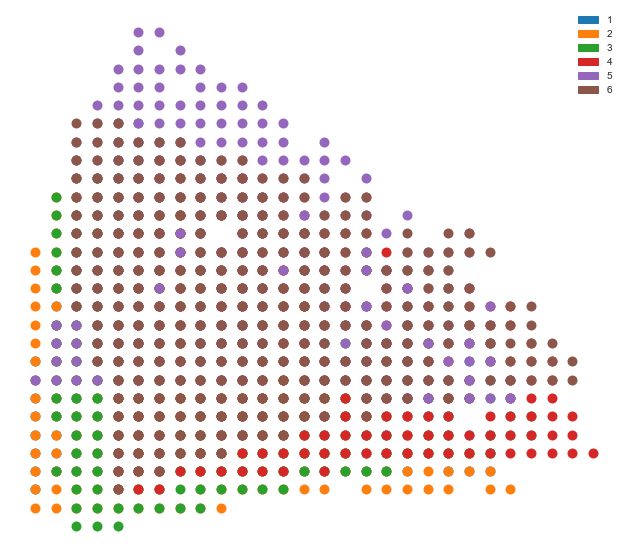

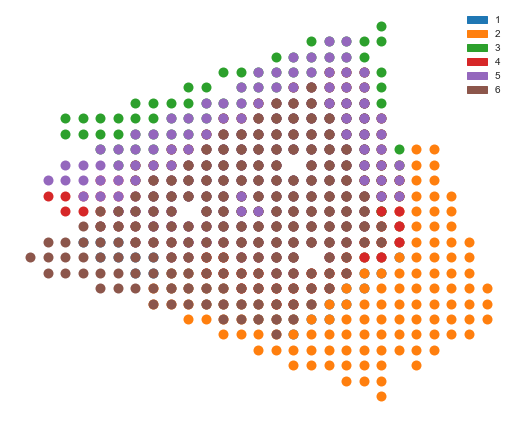

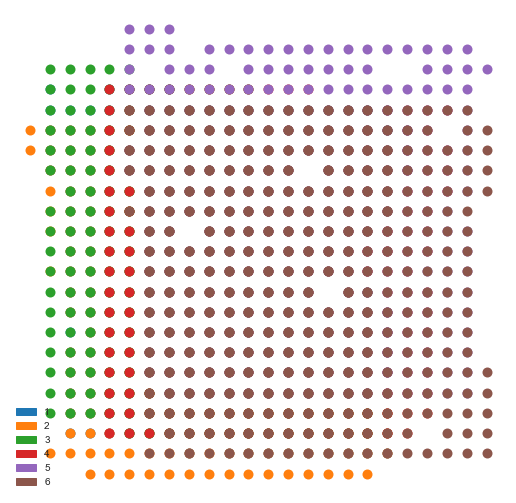

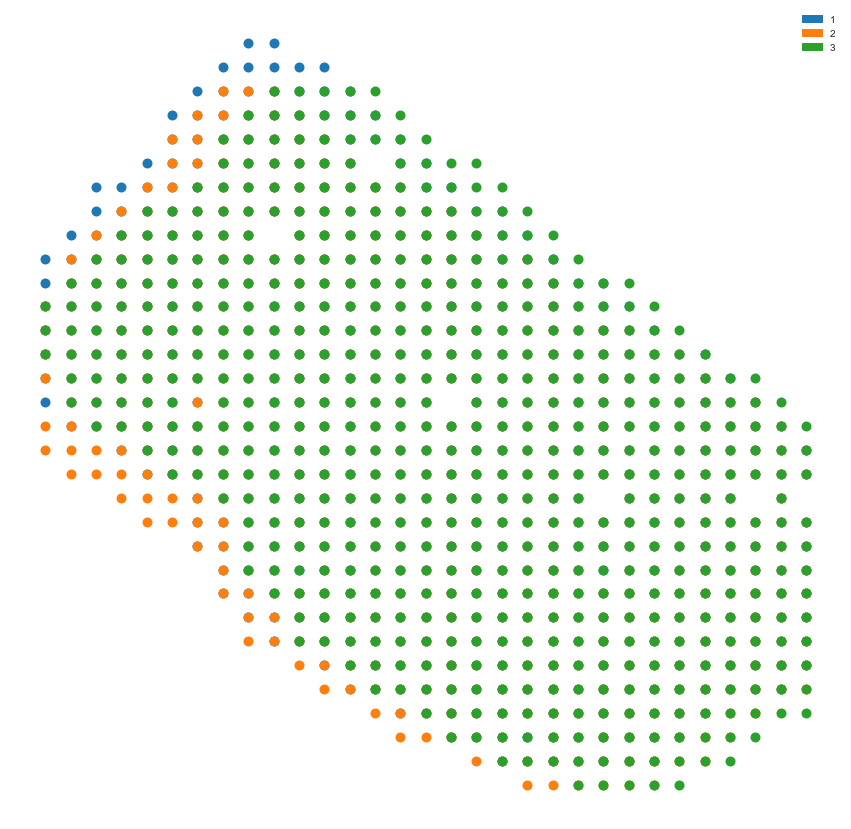

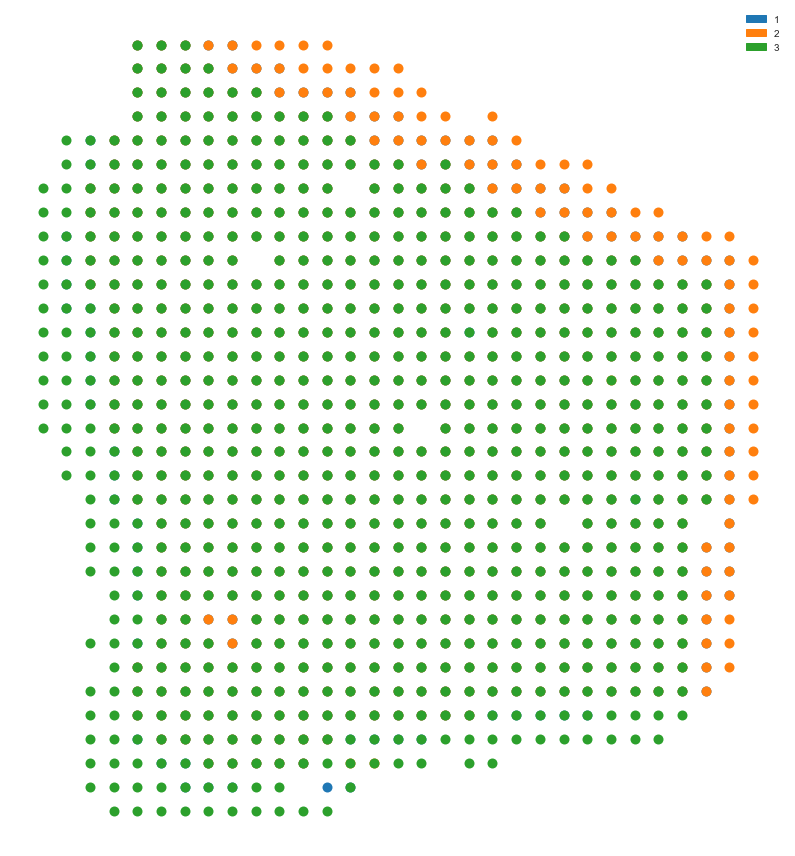

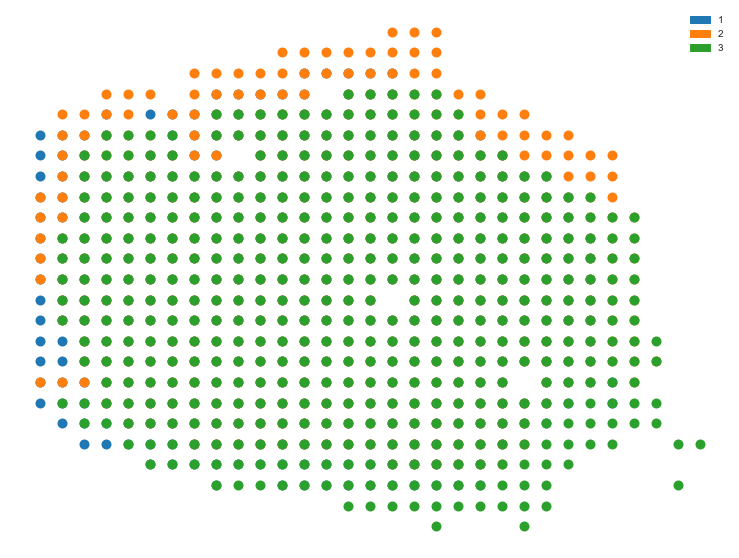

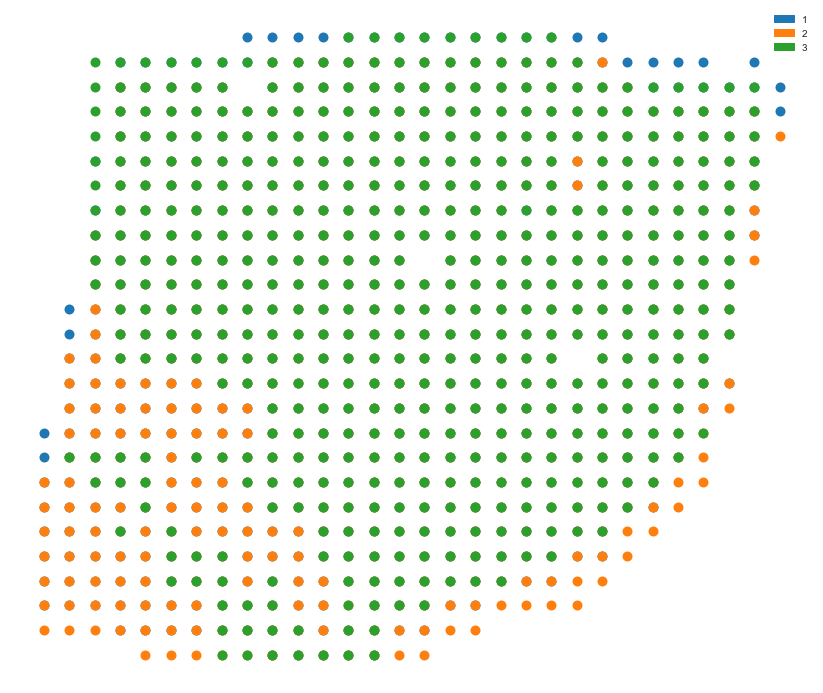

In [5]:
for p in patients:
    l = (patients[p][0].obsm['spatial'].max(axis=0)-patients[p][0].obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0],l[1]))
    for i in range(len(patients[p])):
        pst.plot_slice(patients[p][i],slice_colors[i],s=400)
    plt.legend(handles=[mpatches.Patch(color=slice_colors[i], label='{0}'.format(i+1)) for i in range(len(patients[p]))])
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [6]:
initial_pis = {p:[pst.match_spots_using_spatial_heuristic(patients[p][i].obsm['spatial'],patients[p][i+1].obsm['spatial']) for i in range(len(patients[p])-1)] for p in patients}

In [7]:
alpha = 0.1
pis = {p:[0 for i in range(len(patients[p])-1)] for p in patients}
for p in patients:
    print('Patient ',p)
    for i in range(len(patients[p])-1):
        print("Slices ",i,i+1)
        pis[p][i] = pst.pairwise_align(patients[p][i], patients[p][i+1],alpha=alpha, G_init=initial_pis[p][i])

Patient  A
Slices  0 1
Slices  1 2
Slices  2 3
Slices  3 4
Slices  4 5
Patient  B
Slices  0 1
Slices  1 2
Slices  2 3
Slices  3 4
Slices  4 5
Patient  C
Slices  0 1
Slices  1 2
Slices  2 3
Slices  3 4
Slices  4 5
Patient  D
Slices  0 1
Slices  1 2
Slices  2 3
Slices  3 4
Slices  4 5
Patient  E
Slices  0 1
Slices  1 2
Patient  F
Slices  0 1
Slices  1 2
Patient  G
Slices  0 1
Slices  1 2
Patient  H
Slices  0 1
Slices  1 2


In [8]:
patients_new_slices = {p:[0 for i in range(samples_per_patient[p])] for p in samples_per_patient}
for p in patients:
    patients_new_slices[p] = pst.stack_slices_pairwise(patients[p] , pis[p])

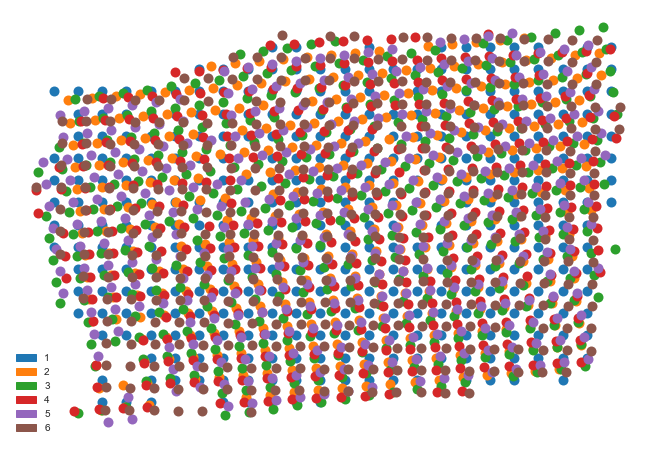

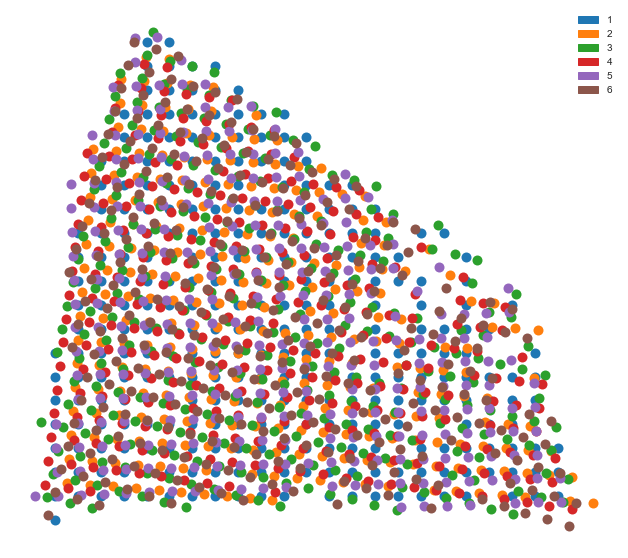

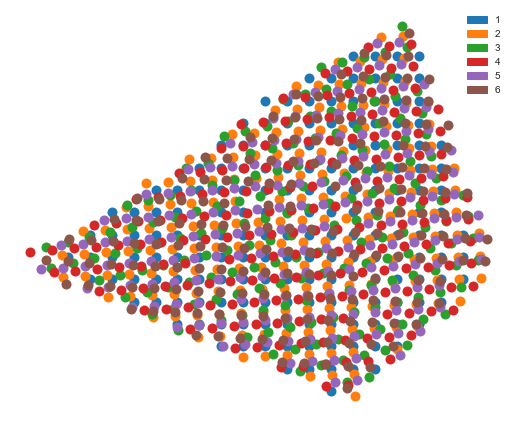

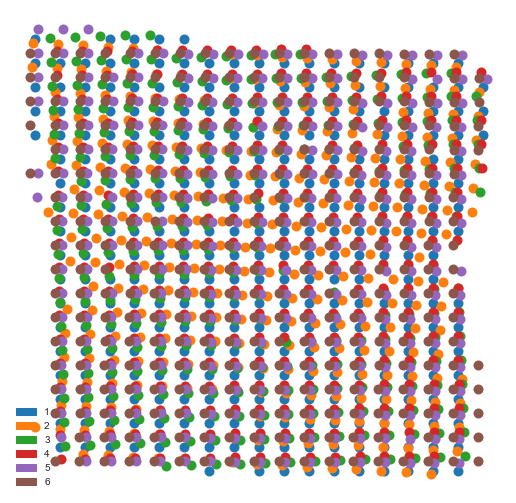

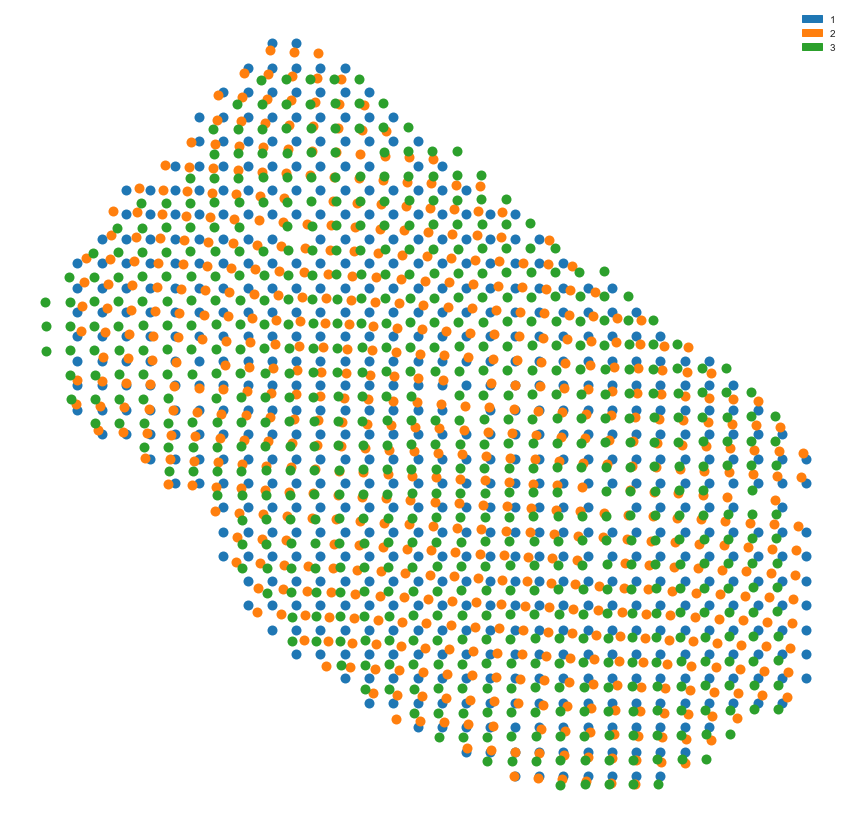

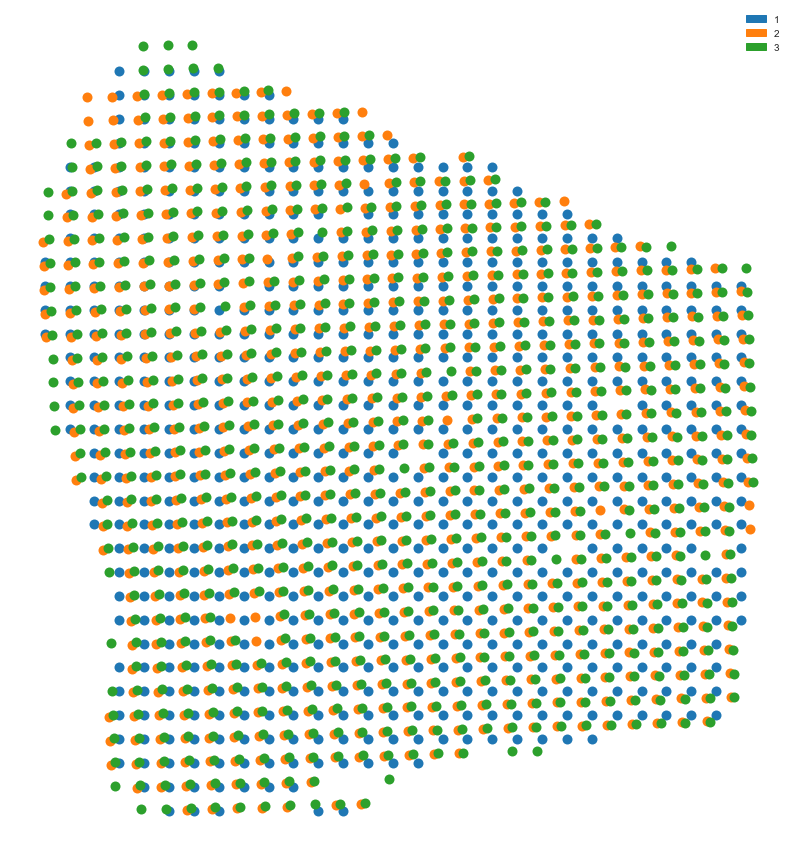

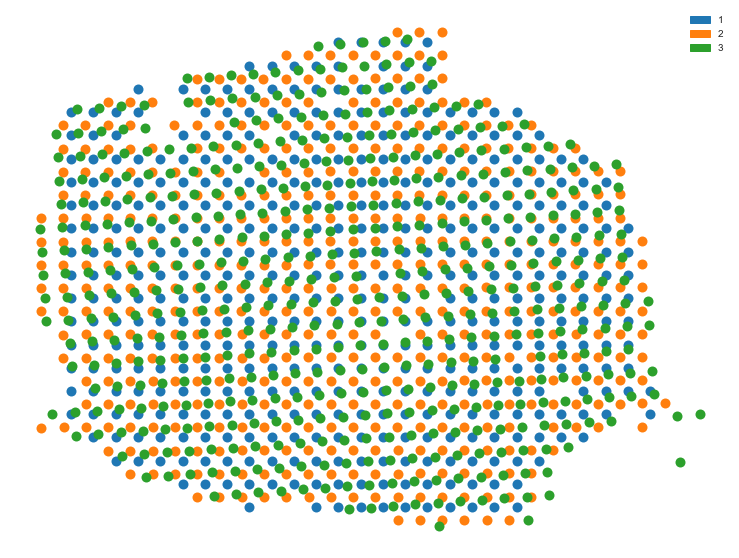

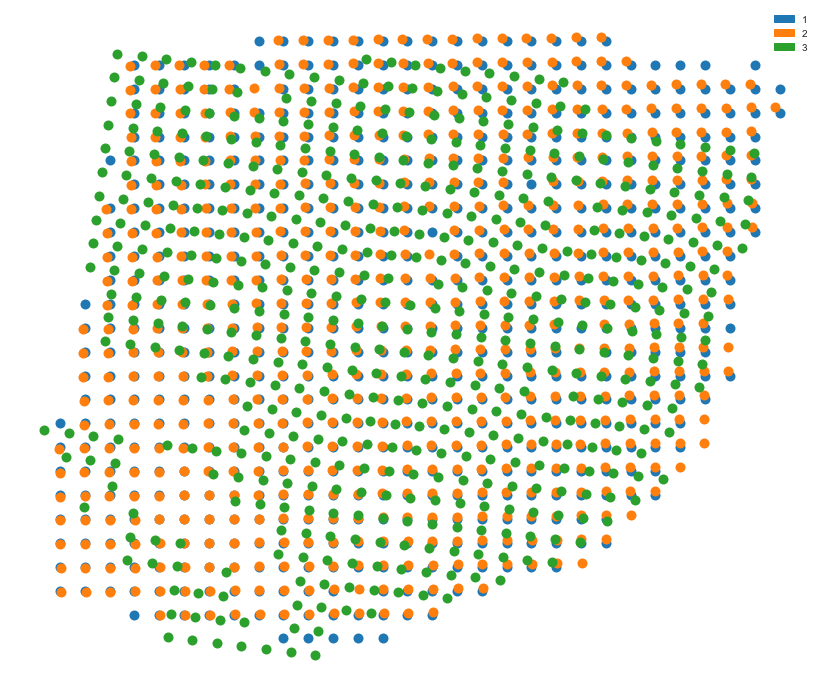

In [9]:
for p in patients_new_slices:
    l = (patients[p][0].obsm['spatial'].max(axis=0)-patients[p][0].obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0],l[1]))
    for i in range(len(patients_new_slices[p])):
        pst.plot_slice(patients_new_slices[p][i],slice_colors[i],s=400)
    plt.legend(handles=[mpatches.Patch(color=slice_colors[i], label='{0}'.format(i+1)) for i in range(len(patients_new_slices[p]))])
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [134]:
import plotly.express as px
import plotly.io as pio
pio.renderers.default='notebook'
#pio.renderers.default='jupyterlab' # uncomment if using jupyterlab

# scale the distance between layers
z_scale = 2 # 20/200 #2

for p in patients_new_slices:
    df = pd.DataFrame(columns=['x','y','z','slice'])
    for i in range(len(patients_new_slices[p])):
        adata = patients_new_slices[p][i]
        df_ = pd.DataFrame(np.concatenate((adata.obsm['spatial'],np.matrix(i*z_scale*np.ones(len(adata))).T,np.matrix((i+1)*np.ones(len(adata))).T),axis=1),columns=['x','y','z','slice'])
        df = df.append(df_, ignore_index=True)
    df = df.sort_values(by=['slice'])
    df['y'] = -df['y']
    df['slice'] = df['slice'].astype(int).astype(str)
    fig = px.scatter_3d(df, x='x', y='y', z='z',
                  color='slice',color_discrete_map={i+1:slice_colors[i] for i in range(len(patients_new_slices[p]))})#color_discrete_sequence=slice_colors)
    fig.update_layout(scene_aspectmode='data',font=dict(size=8))
    config = {'toImageButtonOptions': {
        'format': 'svg', # one of png, svg, jpeg, webp
        'filename': 'custom_image',
        'height': 500,
        'width': 700,
        'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
      }
    }
    fig.update_layout(scene_aspectmode='data',showlegend=False)
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    fig.show(config=config)

In [10]:
initial_slice = {p:0 for p in patients}
initial_slice['G']=1
center_slices = {p:0 for p in patients}
center_pis = {p:0 for p in patients}
initial_pis_center = {p:[pst.match_spots_using_spatial_heuristic(patients[p][initial_slice[p]].obsm['spatial'],patients[p][i].obsm['spatial'],use_ot=True) for i in range(len(patients[p]))] for p in patients}
alpha=0.1
# for p in patients:
#     print('Patient',p)
#     start = time.time()
#     center_slices[p], center_pis[p] = center_align(patients[p][initial_slice[p]], patients[p], alpha=alpha ,random_seed=0, pis_init = initial_pis_center[p], threshold = 1e-5)
#     end = time.time()
#     print('time',end-start)

In [11]:
help(pst.center_align)

Help on function center_align in module paste.PASTE:

center_align(A, slices, lmbda=None, alpha=0.1, n_components=15, threshold=0.001, max_iter=10, dissimilarity='kl', use_rep=None, norm=False, random_seed=None, pis_init=None, distributions=None, verbose=False)
    Computes center alignment of slices.
    
    param: A - Initialization of starting AnnData Spatial Object; Make sure to include gene expression AND spatial info
    param: slices - List of slices (AnnData objects) used to calculate center alignment
    param: lmbda - List of probability weights assigned to each slice; default is uniform weights
    param: n_components - Number of components in NMF decomposition
    param: threshold - Threshold for convergence of W and H
    param: max_iter - maximum number of iterations for solving for center slice
    param: dissimilarity - Expression dissimilarity measure: 'kl' or 'euclidean'
    param: use_rep - If none, uses slice.X to calculate dissimilarity between spots, otherwise us

In [12]:
import multiprocessing as mp
from functools import partial

def temp_center_align_func(random_seed, A, slices, lmbda = None, alpha = 0.1, n_components = 15, threshold = 0.001, max_iter = 10, dissimilarity='kl', use_rep = None, norm = False, pis_init = None, distributions=None, verbose = False):
    return pst.center_align(A, slices, lmbda = lmbda, alpha = alpha, n_components = n_components, threshold = threshold, max_iter = max_iter, dissimilarity=dissimilarity, use_rep = use_rep, norm = norm, random_seed = random_seed, pis_init = pis_init, distributions=distributions, verbose = verbose)

num_rep = mp.cpu_count()-2
for p in patients:
    print('Patient',p)
    start = time.time()
    temp_center_align_func_partial = partial(temp_center_align_func, A=patients[p][initial_slice[p]], slices=patients[p], lmbda = None, alpha = alpha, n_components = 15, threshold = 0.001, max_iter = 10, dissimilarity='kl', use_rep = None, norm = False, pis_init = initial_pis_center[p], distributions=None, verbose = False)
    with mp.get_context('fork').Pool(num_rep) as pool:
        res = pool.map(temp_center_align_func_partial,range(num_rep))
    end = time.time()
    print('time',end-start)
    print([res[i][0].uns['obj'] for i in range(len(res))])
    center_slices[p], center_pis[p] = min(res,key=lambda x: x[0].uns['obj'])

Patient A
Filtered all slices for common genes. There are 9114 common genes.
Filtered all slices for common genes. There are 9114 common genes.
Filtered all slices for common genes. There are 9114 common genes.
Filtered all slices for common genes. There are 9114 common genes.
Filtered all slices for common genes. There are 9114 common genes.
Filtered all slices for common genes. There are 9114 common genes.


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:Solving Center Mapping NMF Problem:

Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0724966361501744
Difference: 1.0724966361501744

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Objective  1.0725311219971136
Difference: 1.0725311219971136

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0726888171941154
Difference: 1.0726888171941154

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0720053173706157
Difference: 1.0720053173706157

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Objective  1.0721927906843964
Difference: 1.0721927906843964

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0722245803125112
Difference: 1.0722245803125112

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0701780726661205
Difference: 0.0023185634840539038

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0700247827339902
Difference: 0.0025063392631234915

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0699332062716835
Difference: 0.002755610922431817

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.069689540684111
Difference: 0.0023157766865047336

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0699402021109927
Difference: 0.002252588573403713

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0700895346334827
Difference: 0.0021350456790285577

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.070001595687888
Difference: 0.00017647697823242048



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0697656965943272
Difference: 0.00025908613966296734



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.069880993397229
Difference: 5.221287445444922e-05



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0695106442887576
Difference: 0.0001788963953532896



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0697894439799664
Difference: 0.000150758131026274



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.0699080628654063
Difference: 0.0001814717680763689

time 188.5101819038391
[1.0697656965943272, 1.070001595687888, 1.0695106442887576, 1.069880993397229, 1.0697894439799664, 1.0699080628654063]
Patient B
Filtered all slices for common genes. There are 7842 common genes.
Filtered all slices for common genes. There are 7842 common genes.
Filtered all slices for common genes. There are 7842 common genes.
Filtered all slices for common genes. There are 7842 common genes.
Filtered all slices for common genes. There are 7842 common genes.
Filtered all slices for common genes. There are 7842 common genes.


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.368989325915135
Difference: 1.368989325915135

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3685599824058485
Difference: 1.3685599824058485

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3684295652425453
Difference: 1.3684295652425453

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3688228066288433
Difference: 1.3688228066288433

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.36963359518769
Difference: 1.36963359518769

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3683550459752314
Difference: 1.3683550459752314

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.359950165441886
Difference: 0.00903916047324893

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3595747920131562
Difference: 0.0089851903926923

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3600056702033523
Difference: 0.008423895039193052

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3603364745838882
Difference: 0.00848633204495508

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Center Mapping NMF Problem:
Objective  1.3604756935266988
Difference: 0.009157901660991064

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3585650342968651
Difference: 0.00979001167836624

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3594993094183538
Difference: 0.0004508560235321202



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3589967993100638
Difference: 0.0010088708932884938

Objective  Iteration: 3
1.3592794326246265
Difference: 0.00029535938852975896

Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3595821925453082
Difference: 0.0007542820385799676



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3585346642822524
Difference: 3.0370014612701723e-05

Objective  1.359690583456804
Difference: 0.0007851100698947899

Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3606042727378482
Difference: 0.001607473427784445

Iteration: 4
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.358197380705929
Difference: 0.002406892031919128

Iteration: 5
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3580483951338778
Difference: 0.0001489855720513411

time 156.38521885871887
[1.3594993094183538, 1.3592794326246265, 1.3595821925453082, 1.3580483951338778, 1.359690583456804, 1.3585346642822524]
Patient C
Filtered all slices for common genes. There are 10101 common genes.
Filtered all slices for common genes. There are 10101 common genes.
Filtered all slices for common genes. There are 10101 common genes.
Filtered all slices for common genes. There are 10101 common genes.
Filtered all slices for common genes. There are 10101 common genes.
Filtered all slices for common genes. There are 10101 common genes.


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Center Mapping NMF Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Center Mapping NMF Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9736676636177733
Difference: 0.9736676636177733

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9728906776472808
Difference: 0.9728906776472808

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9729480824291735
Difference: 0.9729480824291735

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9734411376630469
Difference: 0.9734411376630469

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9734188125532447
Difference: 0.9734188125532447

Iteration: 1


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  0.9727452990955385
Difference: 0.9727452990955385

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.965156784924235
Difference: 0.008510878693538393

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9649463575191195
Difference: 0.007944320128161264

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9647132183781835
Difference: 0.008234864050990054

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9651356151180633
Difference: 0.008305522544983512

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9656182825933732
Difference: 0.007800529959871461

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9647318706191542
Difference: 0.00801342847638431

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9635163720574448
Difference: 0.0016404128667901752

Iteration: 3
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9634847955528137
Difference: 0.0014615619663057577

Iteration: 3
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9635656556907715
Difference: 0.001147562687412007

Iteration: 3
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9637009409962751
Difference: 0.0014346741217882153

Iteration: 3
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9640296123702883
Difference: 0.0015886702230849536

Iteration: 3
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9636531792450527
Difference: 0.001078691374101548

Iteration: 3
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9631542056272291
Difference: 0.0003621664302156935



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.962816728193559
Difference: 0.0006680673592547315



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9630199301191364
Difference: 0.000545725571635014



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9631644975486747
Difference: 0.0005364434476003987



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9632642507505302
Difference: 0.0007653616197580426



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  0.9633512011283958
Difference: 0.0003019781166568869

time 124.70000410079956
[0.9631542056272291, 0.962816728193559, 0.9630199301191364, 0.9631644975486747, 0.9632642507505302, 0.9633512011283958]
Patient D
Filtered all slices for common genes. There are 9538 common genes.
Filtered all slices for common genes. There are 9538 common genes.
Filtered all slices for common genes. There are 9538 common genes.
Filtered all slices for common genes. There are 9538 common genes.
Filtered all slices for common genes. There are 9538 common genes.
Filtered all slices for common genes. There are 9538 common genes.


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1153798225193683
Difference: 1.1153798225193683

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1159440129900846
Difference: 1.1159440129900846

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.115627096387147
Difference: 1.115627096387147



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 1
Objective  1.1161615121471902Solving Pairwise Slice Alignment Problem:

Difference: 1.1161615121471902

Iteration: 1
Solving Pairwise Slice Alignment Problem:Objective 
 1.1164152062780126
Difference: 1.1164152062780126

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Center Mapping NMF Problem:
Objective  1.1158329092991162
Difference: 1.1158329092991162

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1137024305219034
Difference: 0.001677391997464861

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1140296543168298
Difference: 0.0019143586732548457

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1142283851644221
Difference: 0.0019331269827680408

Iteration: 2
Objective  1.1142406177826367
Difference: 0.0021745884953758843
Solving Pairwise Slice Alignment Problem:

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.113790077481559
Difference: 0.0018370189055880726

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.114021060914867
Difference: 0.0018118483842490818

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1137368508888013
Difference: 3.4420366897824906e-05



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1139977470398206
Difference: 3.190727700919105e-05



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1140956066954117
Difference: 0.00013277846901038615



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1140206971883417
Difference: 0.00021992059429498667

Objective  1.113671507126195
Difference: 0.00011857035536411153



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.1139384314976923
Difference: 8.262941717473993e-05

time 165.03948879241943
[1.1137368508888013, 1.1139977470398206, 1.1140956066954117, 1.113671507126195, 1.1140206971883417, 1.1139384314976923]
Patient E
Filtered all slices for common genes. There are 6931 common genes.
Filtered all slices for common genes. There are 6931 common genes.
Filtered all slices for common genes. There are 6931 common genes.
Filtered all slices for common genes. There are 6931 common genes.
Filtered all slices for common genes. There are 6931 common genes.
Filtered all slices for common genes. There are 6931 common genes.
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Cente

/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:

/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(



Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Solving Center Mapping NMF Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Objective  1.3896706842726063
Difference: 1.3896706842726063

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3886015362849555
Difference: 1.3886015362849555

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3914069681015893
Difference: 1.3914069681015893

Iteration: 1
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3899525430068214
Difference: 1.3899525430068214

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Objective  1.3892806134896798
Difference: 1.3892806134896798

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3899054868962712
Difference: 1.3899054868962712

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Objective  1.3834806529130206
Difference: 0.006190031359585735

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Objective  1.3820287011166554
Difference: 0.006572835168300095

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Objective  1.38600123563981
Difference: 0.005405732461779333

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3847089202405953
Difference: 0.00524362276622603

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3845298532785155
Difference: 0.004750760211164273

Iteration: 2
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3847516582982407
Difference: 0.0051538285980305965

Iteration: 2
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Objective  1.3831688016839239
Difference: 0.0003118512290967157

Objective  1.385248363129828
Difference: 0.0007528725099819056



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3817818315051769
Difference: 0.0002468696114785729

Objective  1.3846165949334734
Difference: 8.674165495792252e-05



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3842854551602242
Difference: 0.0004234650803711659



/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3835191039389811
Difference: 0.0012325543592595078

Iteration: 3
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Objective  1.3828442214911276
Difference: 0.0006748824478535198

time 470.0427451133728
[1.3831688016839239, 1.385248363129828, 1.3842854551602242, 1.3846165949334734, 1.3817818315051769, 1.3828442214911276]
Patient H
Filtered all slices for common genes. There are 6572 common genes.
Filtered all slices for common genes. There are 6572 common genes.
Filtered all slices for common genes. There are 6572 common genes.
Filtered all slices for common genes. There are 6572 common genes.
Filtered all slices for common genes. There are 6572 common genes.
Filtered all slices for common genes. There are 6572 common genes.
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:
Iteration: 0
Solving Pairwise Slice Alignment Problem:


/Users/alexanderstrzalkowski/.pyenv/versions/3.8.3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Iteration: 0
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Objective  1.3611750054617016
Difference: 1.3611750054617016

Iteration: 1
Objective  1.360587895615132
Difference: 1.360587895615132

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Pairwise Slice Alignment Problem:
Objective  1.3605983611209027
Difference: 1.3605983611209027

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Objective  1.3617441671848256
Difference: 1.3617441671848256

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Objective  1.3605948800906864
Difference: 1.3605948800906864

Iteration: 1
Solving Pairwise Slice Alignment Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Solving Center Mapping NMF Problem:
Ob

In [14]:
patients_new_slices_with_center = {p:[0 for i in range(samples_per_patient[p])] for p in samples_per_patient}
center_slices_new = {p:0 for p in patients}
for p in patients:
    center_slices_new[p],patients_new_slices_with_center[p] =  pst.stack_slices_center(center_slices[p], patients[p], center_pis[p])

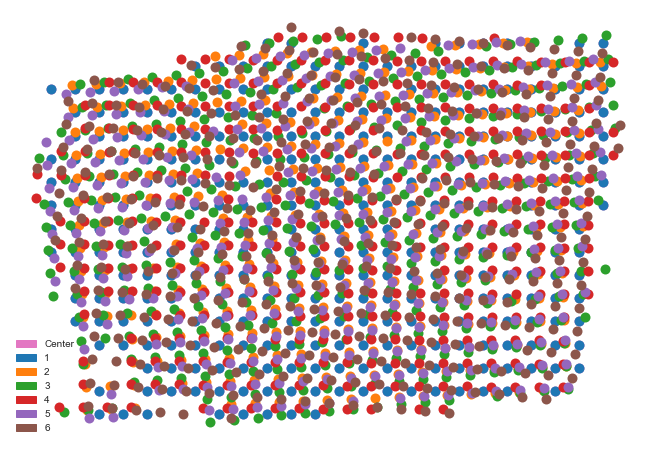

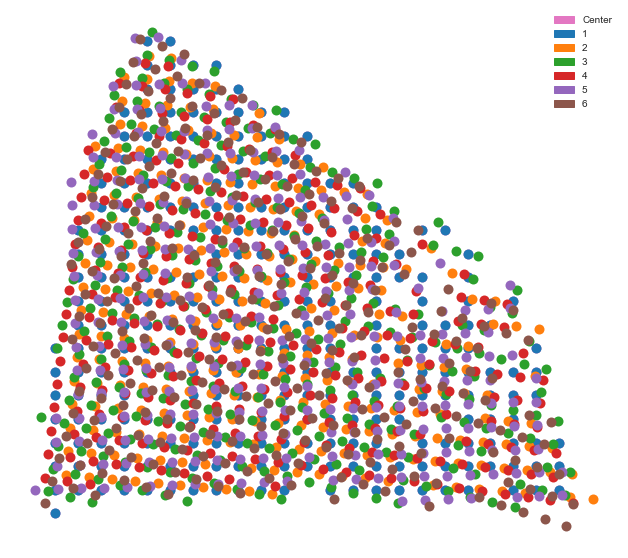

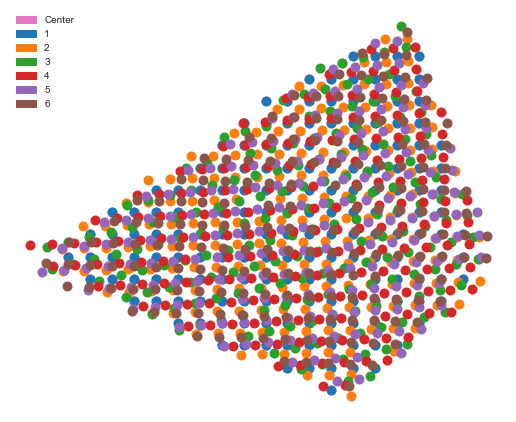

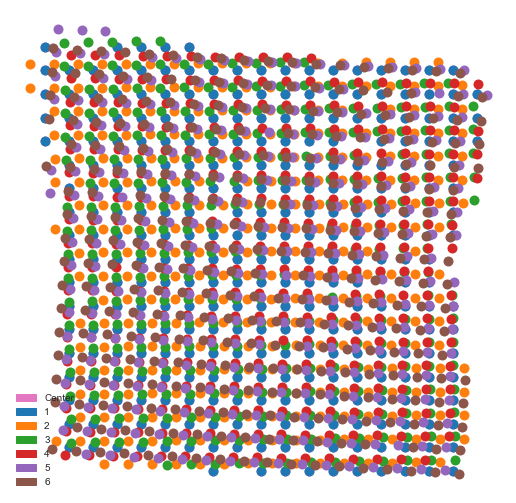

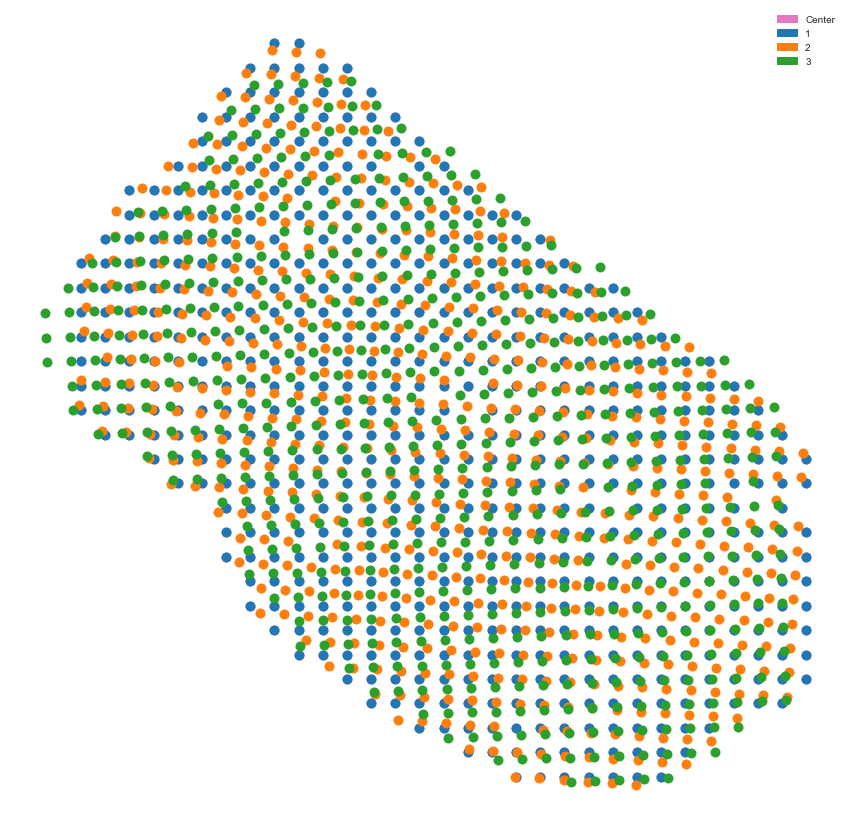

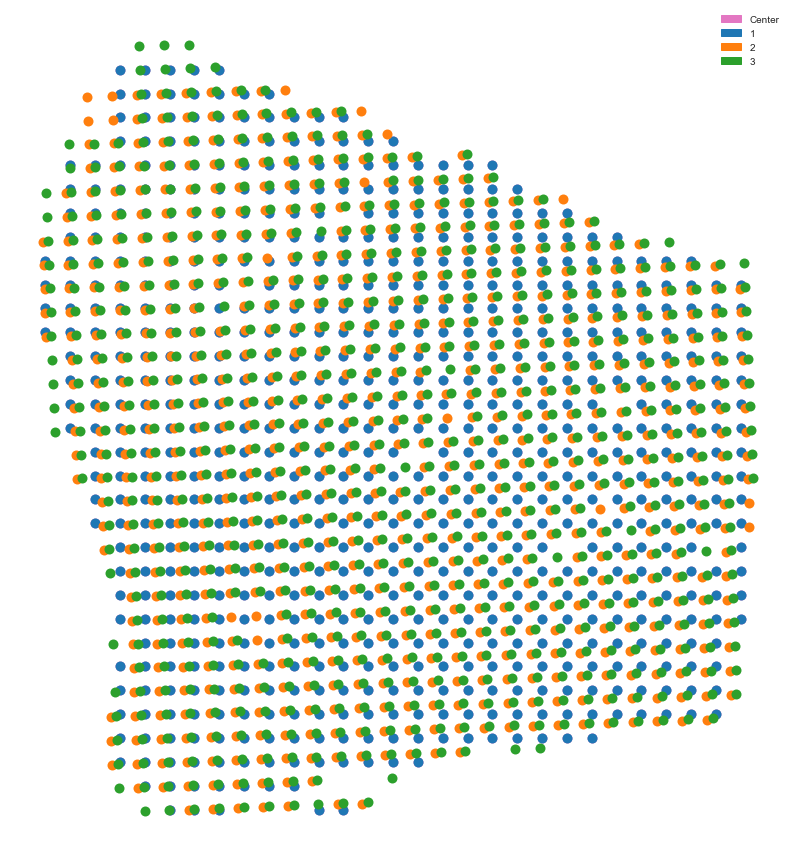

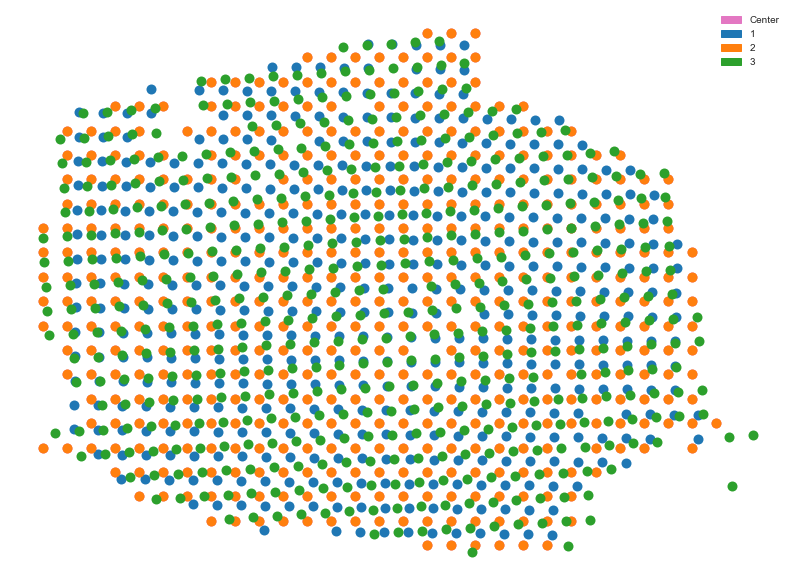

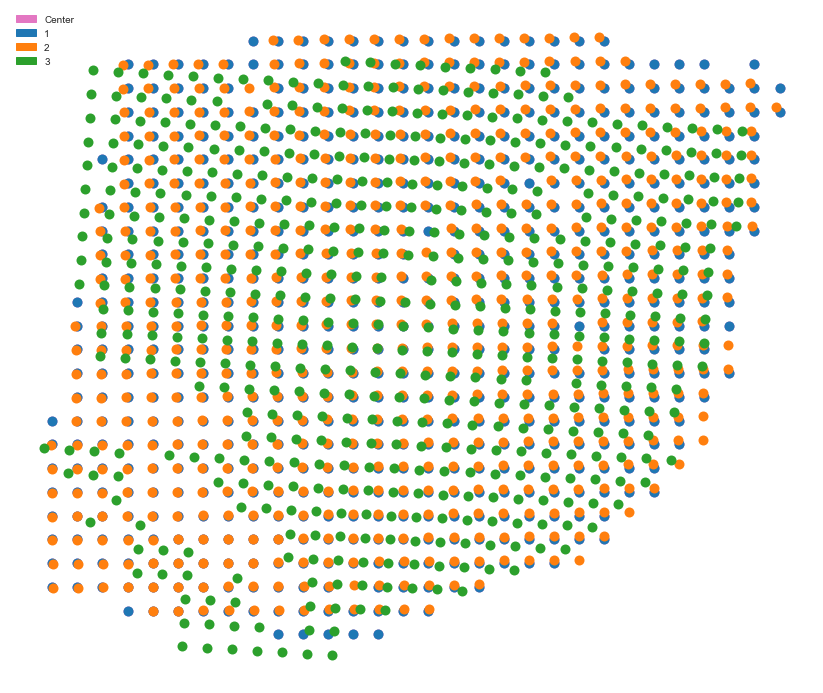

In [16]:
for p in patients_new_slices:
    l = (center_slices_new[p].obsm['spatial'].max(axis=0)-center_slices_new[p].obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0],l[1]))
    pst.plot_slice(center_slices_new[p],slice_colors[6],s=400)
    for i in range(len(patients_new_slices[p])):
        pst.plot_slice(patients_new_slices_with_center[p][i],slice_colors[i],s=400)
    plt.legend(handles=[mpatches.Patch(color=slice_colors[6], label='Center')]+[mpatches.Patch(color=slice_colors[i], label='{0}'.format(i+1)) for i in range(len(patients_new_slices[p]))])
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

['adipose tissue', 'breast glands', 'cancer in situ', 'connective tissue', 'immune infiltrate', 'invasive cancer', 'undetermined']


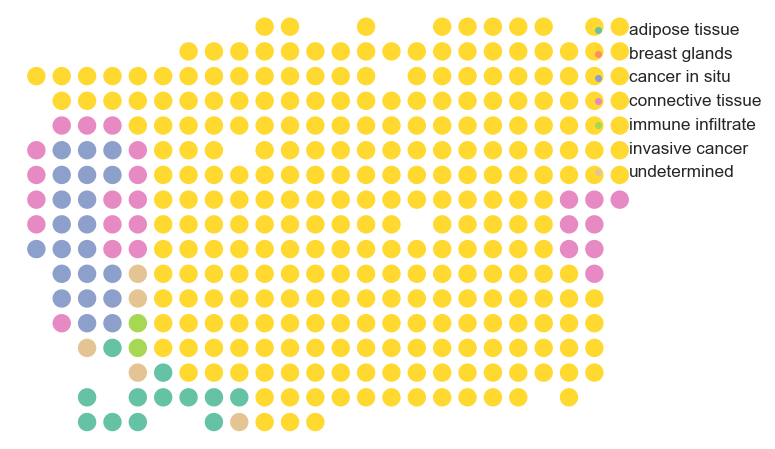

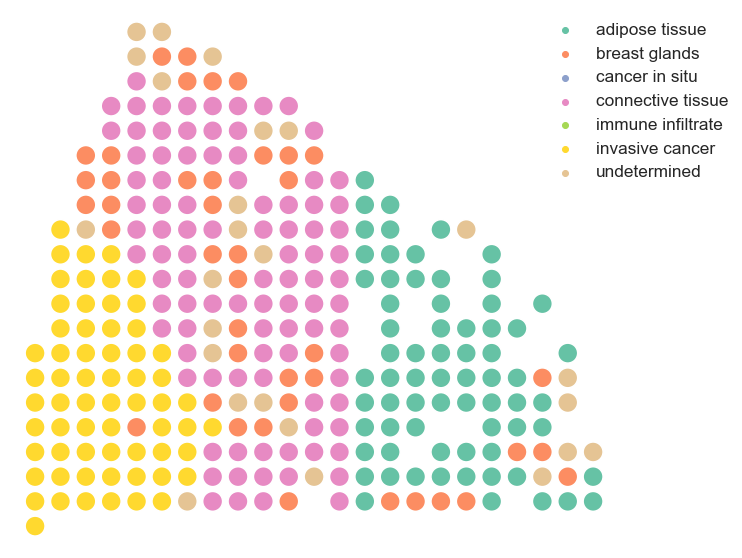

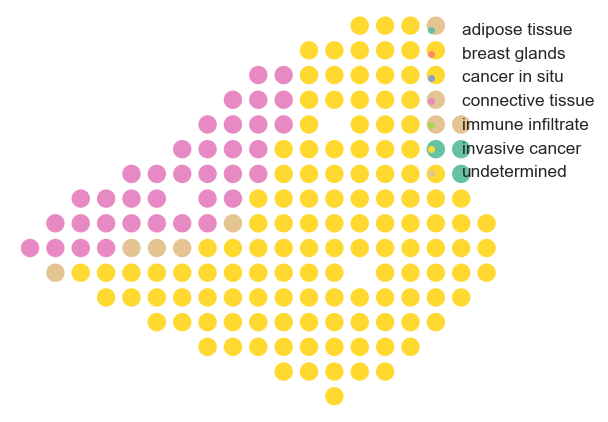

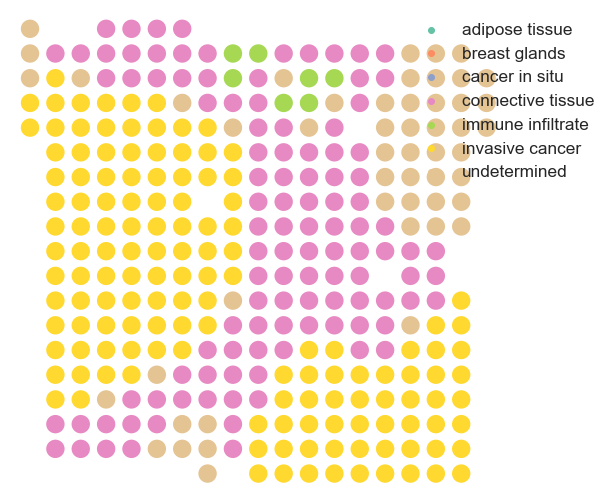

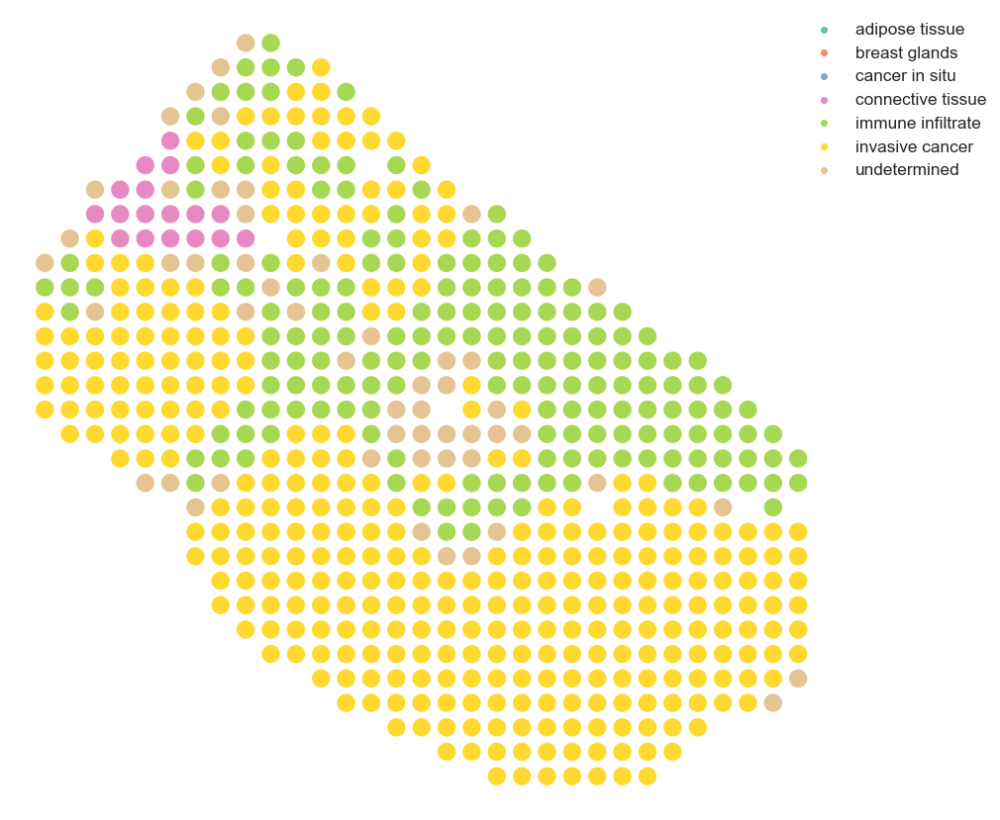

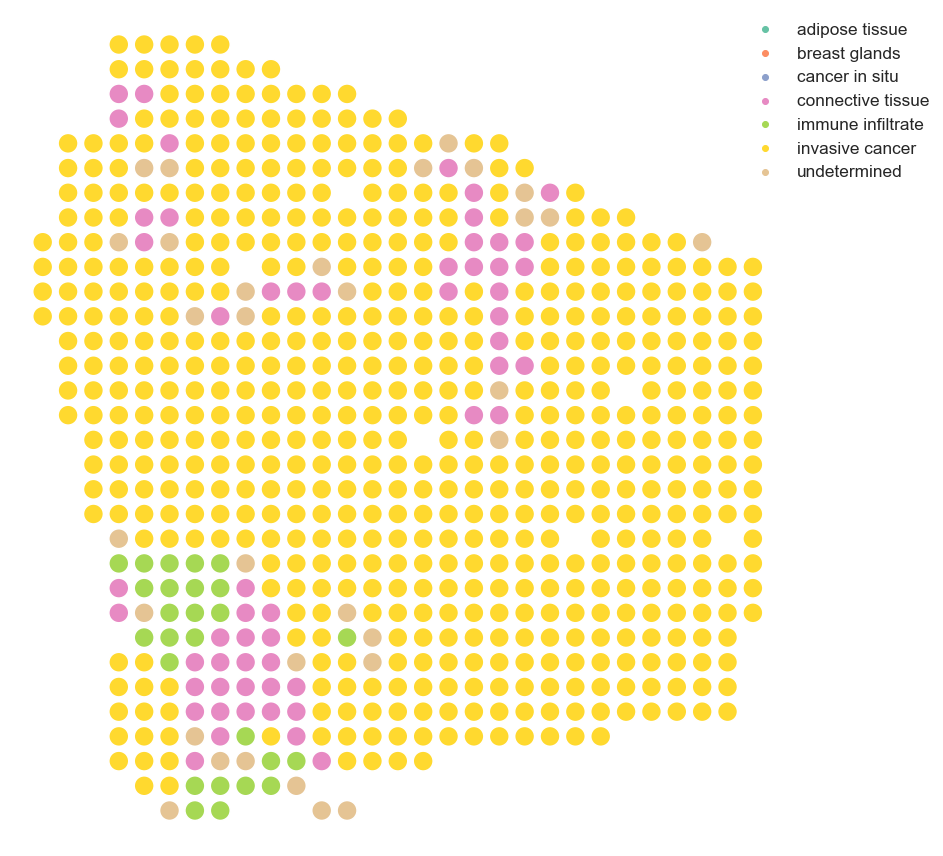

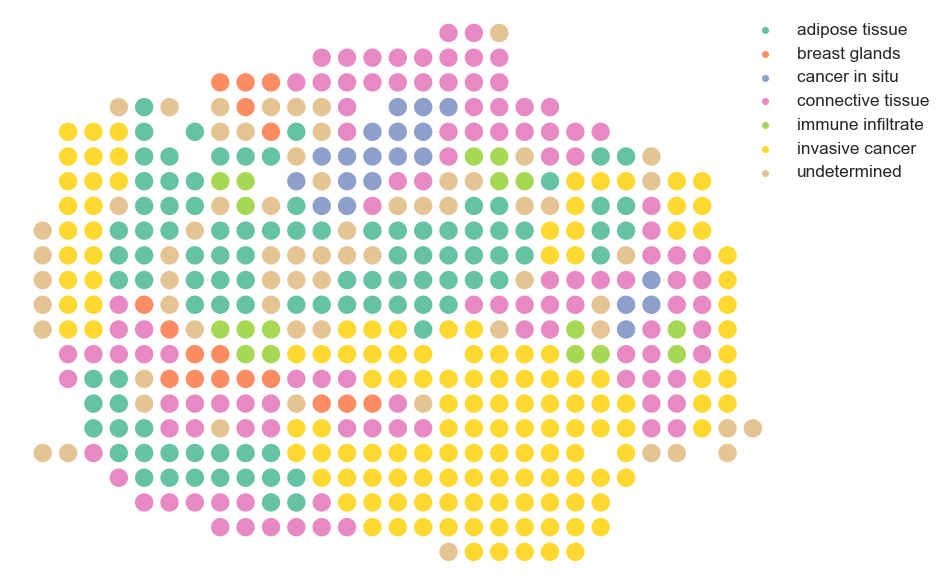

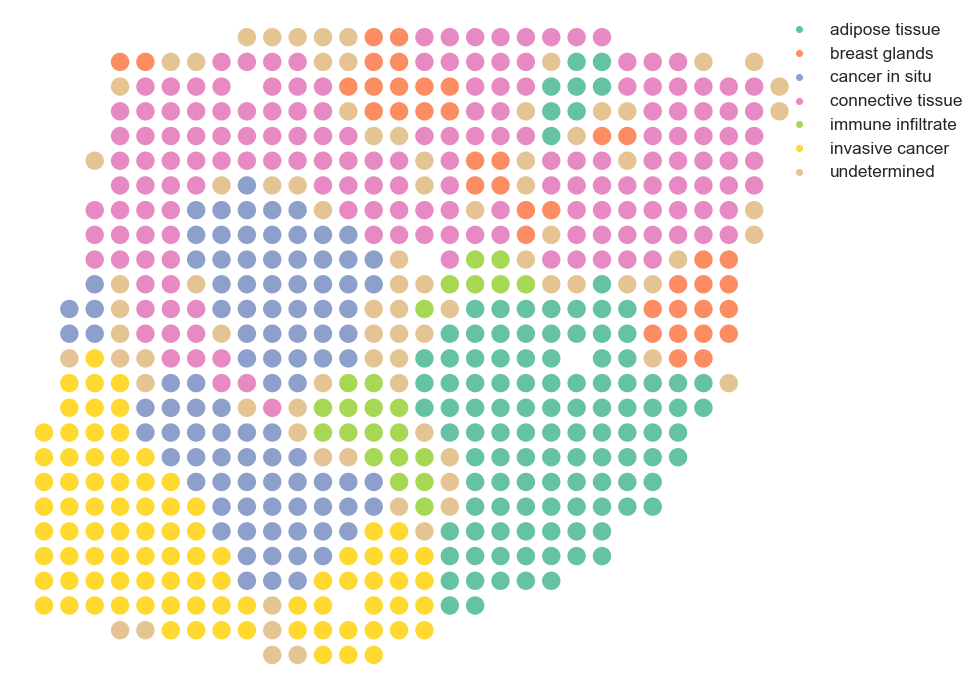

In [21]:
def read_pat_spot_annotation(adata,patient,slice_n=0,path_to_annot='../data/HER2/',path_to_spotfiles='../data/HER2/'):
    annot = pd.read_csv(path_to_annot+'{0}{1}_labeled_coordinates.tsv'.format(patient,slice_n+1),sep='\t')
    spotfile = pd.read_csv(path_to_spotfiles+'{0}{1}_selection.tsv'.format(patient,slice_n+1),sep='\t')
    new_df = pd.merge(spotfile, annot,  how='left', left_on=['new_x','new_y'], right_on = ['x','y'])
    new_df.index = new_df['x_x'].astype(str)+'x'+new_df['y_x'].astype(str)
    new_df = pd.merge(adata.obs, new_df,left_index=True, right_index=True)
    new_df = new_df.rename(columns={'x_x':'x','y_x':'y','pixel_x_x':'pixel_x_spotfile','pixel_y_x':'pixel_y_spotfile','pixel_x_y':'pixel_x_lbl','pixel_y_y':'pixel_y_lbl'})
    new_df= new_df.drop(columns=['selected','Row.names','x_y','y_y'])
    if not 'label' in adata.obs: adata.obs = new_df
    
unique_labels = set()
for p in patients:
    read_pat_spot_annotation(center_slices[p],p,initial_slice[p])
    unique_labels = unique_labels.union(set(pd.unique(center_slices[p].obs['label'])))
unique_labels = sorted(list(unique_labels))
print(unique_labels)
    
for p in patients:
    l = (center_slices[p].obsm['spatial'].max(axis=0)-center_slices[p].obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0],l[1]))
    sns.scatterplot(data=center_slices[p].obs, x="x", y="y",hue='label',palette="Set2",s=400, hue_order = unique_labels)
    plt.legend(fontsize="xx-large",loc='upper right',bbox_to_anchor=(1.2, 1.0))
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [22]:
from sklearn.cluster import KMeans
number_of_clusters = {'A':6,'B':6,'C':7,'D':6,'E':5,'F':4,'G':6,'H':5}
for p in patients:
    W = center_slices[p].uns['paste_W'].copy()
    W = (W.T/W.sum(axis=1)).T
    k = number_of_clusters[p]
    clustering_alg = KMeans(n_clusters=k, random_state=0, n_init=500).fit(W)
    kmean_labels = clustering_alg.fit_predict(W)
    center_slices[p].obs['clustering_W'] = pd.Series(np.array(kmean_labels,dtype=str),index=center_slices[p].obs.index,dtype='category')
    ari = sklearn.metrics.adjusted_rand_score(center_slices[p].obs.loc[center_slices[p].obs['label']!='undetermined','label'],center_slices[p].obs.loc[center_slices[p].obs['label']!='undetermined','clustering_W'])
    print(p,'ARI',ari)

A ARI 0.18672981775723602
B ARI 0.3208971437555909
C ARI 0.0520660366633564
D ARI 0.18420779556579323
E ARI 0.14985283141157874
F ARI 0.14774512702505005
G ARI 0.3097107529367647
H ARI 0.3797159492603491


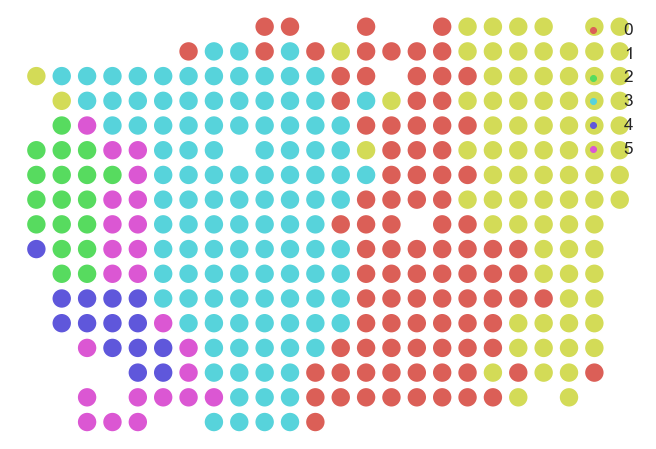

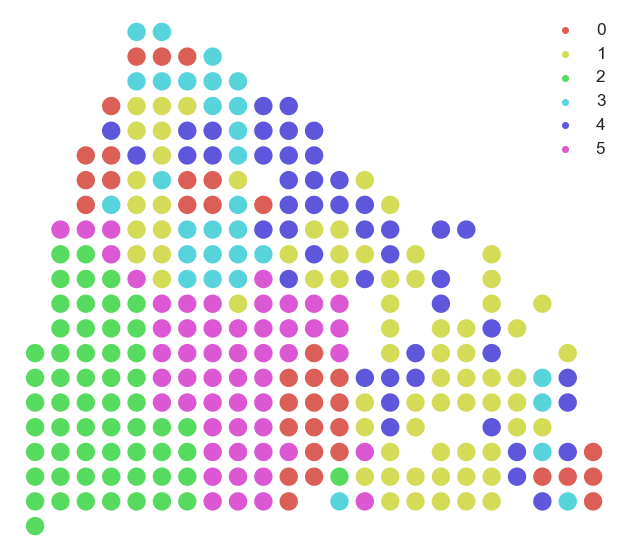

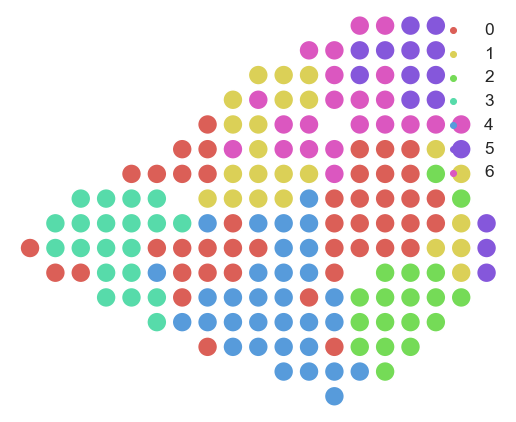

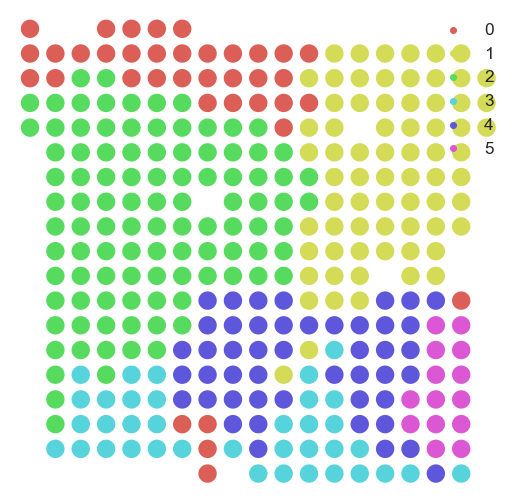

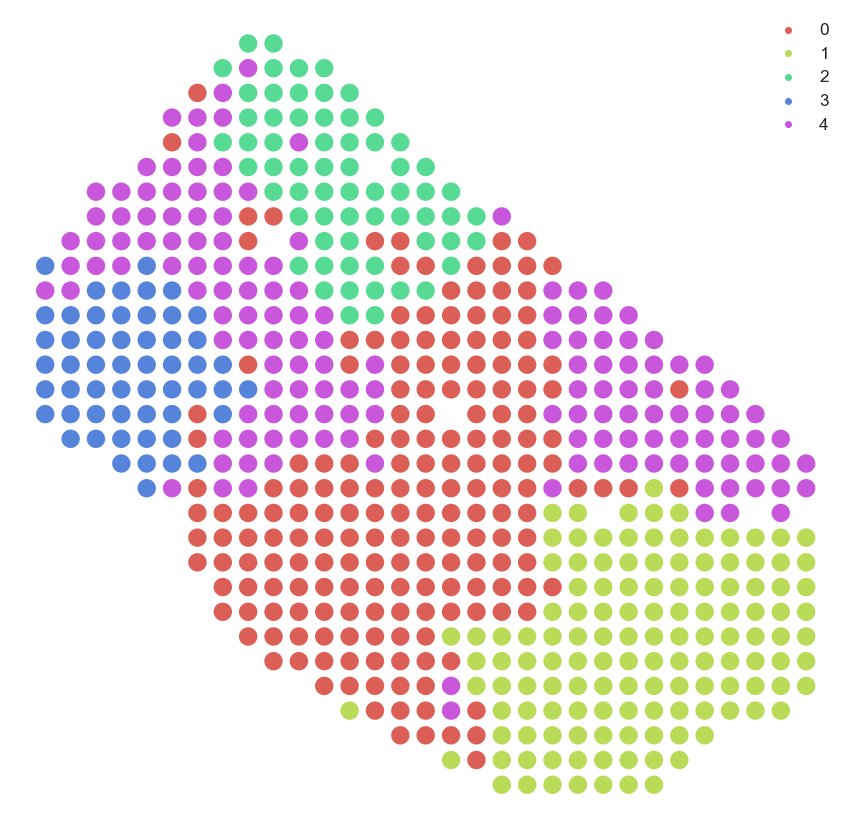

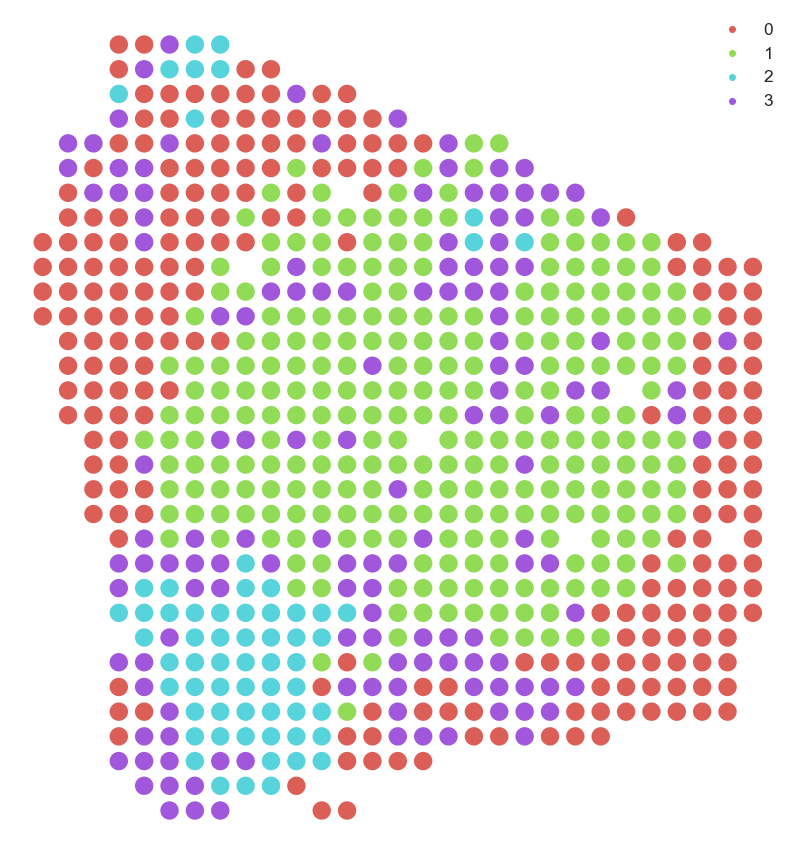

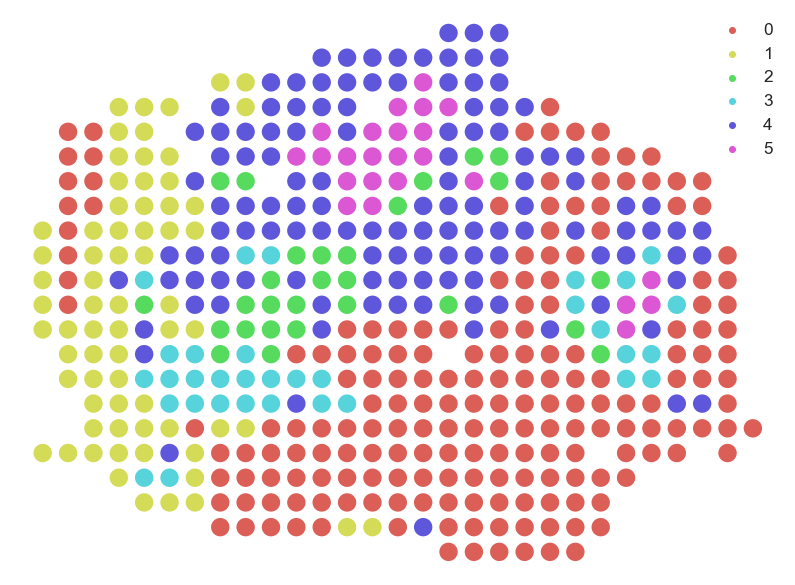

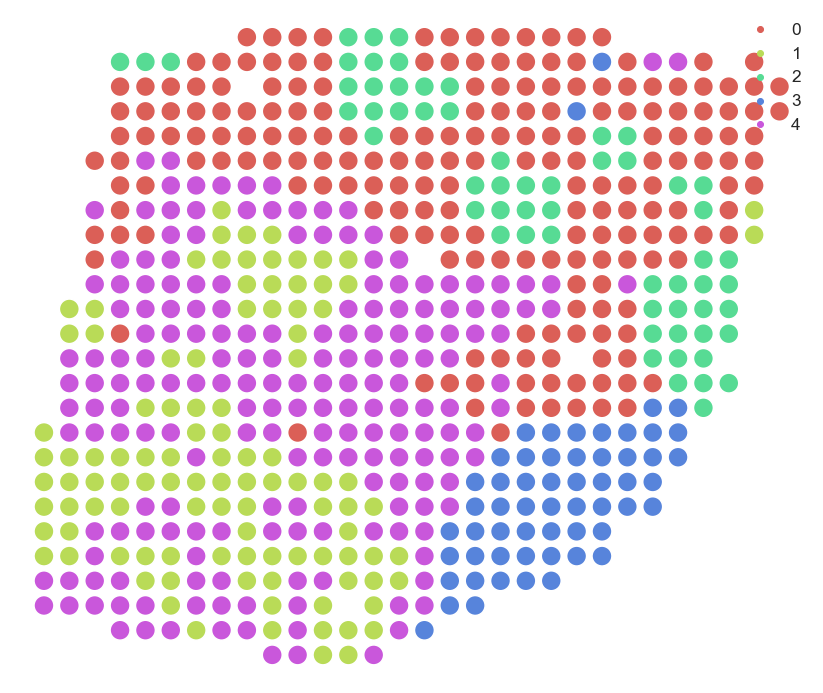

In [141]:
for p in patients:
    l = (center_slices[p].obsm['spatial'].max(axis=0)-center_slices[p].obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0],l[1]))
    sns.scatterplot(data=center_slices[p].obs, x="x", y="y",hue='clustering_W',palette='hls',s=400)
    plt.legend(fontsize="xx-large",loc='upper right',bbox_to_anchor=(1.0, 1.0))
    plt.gca().invert_yaxis()
    plt.axis('off')
    plt.show()

In [25]:
for p in initial_slice:
    s = pd.read_csv('../data/HER2/{0}{1}-cluster-annotation.tsv.gz'.format(p,initial_slice[p]+1),delimiter='\t',index_col=0)
    s.index = s['x'].astype(str)+'x'+s['y'].astype(str)
    print(p)
    l = list(set(s.index).intersection(set(center_slices[p].obs.index)))
    ari = sklearn.metrics.adjusted_rand_score(center_slices[p].obs.loc[l,'label'].loc[center_slices[p].obs.loc[l,'label']!='undetermined'],s.loc[l,'label'].loc[center_slices[p].obs.loc[l,'label']!='undetermined'])
    print(ari)

A
0.1581177925172474
B
0.26834967167815443
C
0.061848943609476494
D
0.18830917653138649
E
0.08484980768307417
F
0.0837085197560337
G
0.4284854567384056
H
0.36900056139896126


Patient  G


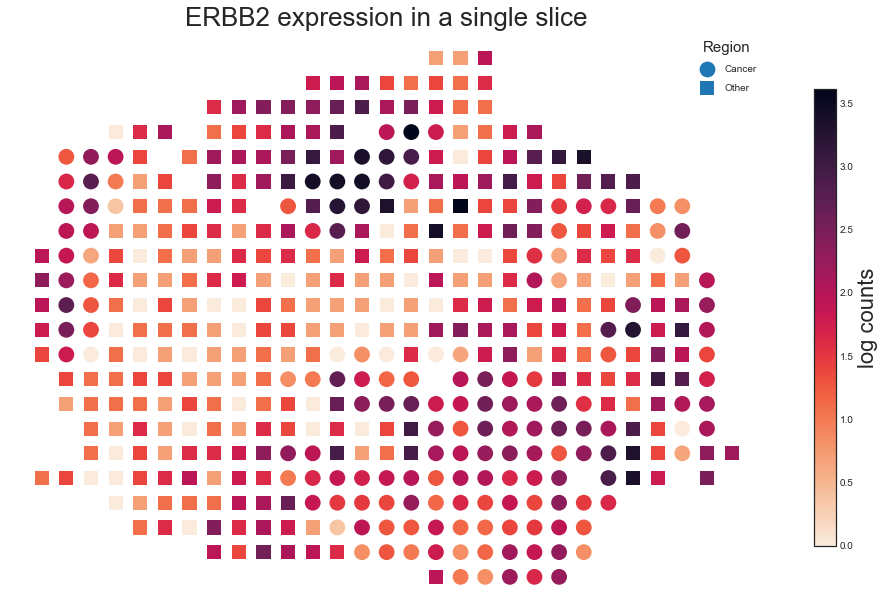

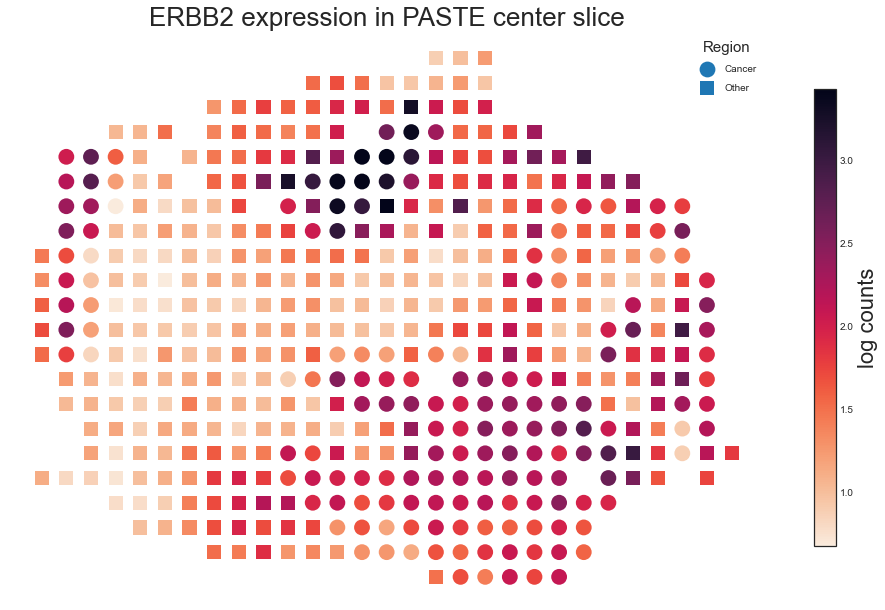

In [24]:
def plot_2d_expression(layer,gene,save=False,name="",title='',vmin=None,vmax=None,layer_idx=None,norm=False,draw_contours=False):
    cmap = sns.color_palette("rocket_r", as_cmap=True) #sns.color_palette("magma", as_cmap=True) #sns.cubehelix_palette(as_cmap=True)
    v = to_dense_array(layer[:,gene].X).copy().ravel() + 1
    if norm: v = v/layer.gene_exp.sum(axis=1)
    v = np.log(v)
    l = (layer.obsm['spatial'].max(axis=0)-layer.obsm['spatial'].min(axis=0))/2
    fig = plt.figure(figsize=(l[0]+3,l[1]))
    scat1 = plt.scatter(layer[layer.obs['label'].isin(['cancer in situ','invasive cancer'])].obsm['spatial'][:,0],
                       layer[layer.obs['label'].isin(['cancer in situ','invasive cancer'])].obsm['spatial'][:,1],linewidth=0,s=1000, 
                       marker=".",c=v[layer.obs['label'].isin(['cancer in situ','invasive cancer'])],cmap=cmap,vmin=vmin,vmax=vmax)
    
    scat2 = plt.scatter(layer[~layer.obs['label'].isin(['cancer in situ','invasive cancer'])].obsm['spatial'][:,0],
                       layer[~layer.obs['label'].isin(['cancer in situ','invasive cancer'])].obsm['spatial'][:,1],linewidth=0,s=200, 
                       marker="s",c=v[~layer.obs['label'].isin(['cancer in situ','invasive cancer'])],cmap=cmap,vmin=vmin,vmax=vmax)
    
#     scat = sns.scatterplot(data=layer.obs, x="x", y="y",c=v,cmap=cmap,s=400)
    plt.gca().set_title(title, fontsize=26)
    cbar = plt.colorbar(scat2,shrink=0.8, anchor=(0.5,0.5))
    cbar.ax.set_ylabel('log counts',fontsize=22)
    plt.axis('off')
    plt.gca().invert_yaxis()
    
#     plt.legend(handles=[mpatches.Patch(color='b', label='cancer',marker="."),mpatches.Patch(color='b', label='other')],fontsize=10,title='Region',title_fontsize=15,bbox_to_anchor=(1, 1))
    plt.legend([scat1, scat2], ["Cancer", "Other"], fontsize=10,title='Region',title_fontsize=15,labelspacing = 1)
    
    if draw_contours:
#         for l in ['adipose tissue', 'breast glands', 'connective tissue', 'immune infiltrate', 'undetermined']:
        for l in ['cancer in situ','invasive cancer']:
            contours = get_scatter_contours(layer,layer.obs['label'],[l])
            for k in range(len(contours)):
                plt.plot(layer.obsm['spatial'][contours[k], 0], layer.obsm['spatial'][contours[k], 1], 'lime',lw=4,alpha=0.6)
    
    plt.show()
    return

def get_scatter_contours(layer,labels,interest = ['WM']):
    idx = np.array(range(len(labels)))[(labels.isin(interest)).to_numpy()]
#     idx_not =  np.array(range(len(labels)))[(labels.isin(set(labels.cat.categories).difference(interest))).to_numpy()]
    idx_not =  np.array(range(len(labels)))[(labels.isin(set(pd.unique(labels)).difference(interest))).to_numpy()]
    dist = scipy.spatial.distance_matrix(layer.obsm['spatial'],layer.obsm['spatial'])
    min_dist = np.min(dist[dist>0])
    eps = 0.01
    edges = np.zeros(dist.shape)
    edges[dist>0] = (dist[dist>0]-min_dist)**2<eps
    border = list(filter(lambda x: np.sum(edges[x,idx_not]>0),idx))
    j = np.argmin(layer.obsm['spatial'][border,0])
    contours,left = [[border[j]]],set(border).difference(set([border[j]]))
    for i in range(1,len(border)):
        last = contours[-1][-1]
        neighbors = set(left).intersection(np.where((dist[last,:]-min_dist)**2<eps)[0])
        if len(neighbors)>0:
            j = neighbors.pop()
            contours[-1].append(j)
        else:
            l = list(left)
            j = l[np.argmin(layer.obsm['spatial'][l,0])]
            contours.append([j])
        left = left.difference(set([j]))
    return contours

gene = 'ERBB2'
save=False
for p in ['G']:
    print('Patient ',p)
    patients[p][initial_slice[p]].obs['label'] = center_slices[p].obs['label']
    plot_2d_expression(patients[p][initial_slice[p]],gene,save=save,name="initial_slice_{0}".format(gene),title = '{} expression in a single slice'.format(gene))
    plot_2d_expression(center_slices[p],gene,save=save,name="center_slice_{0}".format(gene),title = '{} expression in PASTE center slice'.format(gene))